In [1]:
import numpy as np
import matplotlib.pyplot as plt
import time
from sklearn.datasets import fetch_openml
import umap
%matplotlib inline
import warnings

warnings.filterwarnings('ignore')

In [2]:
mnist = fetch_openml('Fashion-MNIST', version=1, cache=True)

In [3]:
np.random.seed(123)

indices = np.random.choice(70000,10000)
X = mnist.data[indices] / 255.0
y = mnist.target[indices]

print(X.shape, y.shape)

(10000, 784) (10000,)


1.Veri setini yükleyin ve verileri normalleştirmek gibi ön işlemlerinizi yapın.  
2.UMAP'ı verilere uygulayın.  
3.İki boyutlu UMAP gösterimini kullanarak, derste yaptığımız gibi veri noktalarını renklendirip etiketleyerek verilerin grafiğini çizin.  
4.UMAP çözümünün tatmin edici olduğunu düşünüyor musunuz? Farklı sınıfları kolayca ayırt edebiliyor musunuz? Hangisi daha iyi bir iş çıkardı: UMAP mi? yoksa (t-SNE veya PCA)mi?  
5.Şimdi, UMAP'in farklı hiperparametre değerleri ile oynayın ve her biri için UMAP uygulayın. İki boyutlu gösterim netliği açısından hangi kombinasyon en iyisidir?  

In [5]:
time_start = time.time()

umap_results = umap.UMAP(n_neighbors=5,
                      min_dist=0.3,
                      metric='correlation').fit_transform(X)

print('UMAP tamamlandı! Geçen süre: {} saniye'.format(time.time()-time_start))

UMAP tamamlandı! Geçen süre: 54.293925046920776 saniye


In [6]:
plt.figure(figsize=(10,5))
colours = ["r","b","g","c","m","y","k","r","burlywood","chartreuse"]
for i in range(umap_results.shape[0]):
    plt.text(umap_results[i, 0], umap_results[i, 1], y[i],
             color=colours[int(y[i])],
             fontdict={'weight': 'bold', 'size': 50}
        )

plt.xticks([])
plt.yticks([])
plt.axis('off')
plt.show()

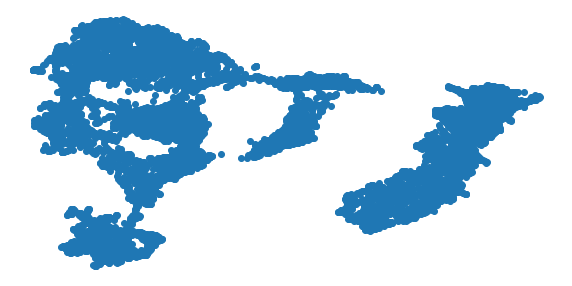

In [7]:
plt.figure(figsize=(10,5))
plt.scatter(umap_results[:, 0], umap_results[:, 1])
plt.xticks([])
plt.yticks([])
plt.axis('off')
plt.show()

n_neighbors parametresini 10 yapıp çalıştıralım.

In [8]:
time_start = time.time()

umap_results = umap.UMAP(n_neighbors=10,
                      min_dist=0.3,
                      metric='correlation').fit_transform(X)

print('UMAP tamamlandı! Geçen süre: {} saniye'.format(time.time()-time_start))

UMAP tamamlandı! Geçen süre: 64.75625038146973 saniye


In [9]:
plt.figure(figsize=(10,5))
colours = ["r","b","g","c","m","y","k","r","burlywood","chartreuse"]
for i in range(umap_results.shape[0]):
    plt.text(umap_results[i, 0], umap_results[i, 1], y[i],
             color=colours[int(y[i])],
             fontdict={'weight': 'bold', 'size': 50}
        )

plt.xticks([])
plt.yticks([])
plt.axis('off')
plt.show()

Bu seferde ilkine göre min_dist parametresini 1 yapıp çalıştırdık.

In [10]:
time_start = time.time()

umap_results = umap.UMAP(n_neighbors=5,
                      min_dist=1,
                      metric='correlation').fit_transform(X)

print('UMAP tamamlandı! Geçen süre: {} saniye'.format(time.time()-time_start))

UMAP tamamlandı! Geçen süre: 49.216381788253784 saniye


In [11]:
plt.figure(figsize=(10,5))
colours = ["r","b","g","c","m","y","k","r","burlywood","chartreuse"]
for i in range(umap_results.shape[0]):
    plt.text(umap_results[i, 0], umap_results[i, 1], y[i],
             color=colours[int(y[i])],
             fontdict={'weight': 'bold', 'size': 50}
        )

plt.xticks([])
plt.yticks([])
plt.axis('off')
plt.show()